<a href="https://colab.research.google.com/github/iqbalfunn/TugasAkhir-YOLO/blob/main/TA_Roboflow_Train_YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cara Melatih YOLOv5 pada Custom Objek

Tutorial ini berdasarkan [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). Notebook ini menampilkan pelatihan tentang **objek kustom Anda sendiri**. Terima kasih banyak kepada Ultralytics karena telah menyatukan repositori ini - kami berharap bahwa dengan kombinasi alat pengelolaan data yang bersih di Roboflow, teknologi ini akan mudah diakses oleh pengembang mana pun yang ingin menggunakan computer vision dalam proyek mereka.

### Langkah-langkah yang dicakup pada tutorial ini

Dalam tutorial ini, kita akan membahas langkah-langkah yang diperlukan untuk melatih YOLOv5 pada objek kustom Anda. Kami menggunakan [kumpulan data deteksi asap kebakaran hutan](https://www.kaggle.com/datasets/ahemateja19bec1025/wildfiresmokedatasetyolo), yang merupakan sumber terbuka dan gratis untuk digunakan. Anda juga dapat menggunakan notebook ini pada data Anda sendiri.

Untuk melatih, kita mengambil langkah-langkah berikut ini.

* Install keperluan YOLOv5
* Download custom dataset YOLOv5 dengan format yang benar
* Tulis konfigurasi model dan arsitektur YOLOv5
* Jalankan YOLOv5 training
* Evaluasi YOLOv5 performa
* Visualisasikan data latih YOLOv5
* Jalankan YOLOv5 inferensi pada gambar uji
* Export YOLOv5 weights untuk inferensi di masa mendatang

### **Tentang**

[Roboflow](https://roboflow.com) memungkinkan tim menerapkan model visi komputer khusus dengan cepat dan akurat. Konversikan data dari ke format anotasi, nilai kesehatan set data, praproses, tambah, dan lainnya. Ini gratis untuk 1000 gambar sumber pertama Anda.

![Roboflow Wordmark](https://i.imgur.com/dcLNMhV.png)



#Install Keperluan YOLOv5

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
# menyalin YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # salin repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5/yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [ ]:
# install plugin dan library yang dibutuhkan
!pip install -qr requirements.txt  # install plugin (ignore errors)
import torch

from IPython.display import Image, clear_output  # untuk menampilkan gambar
from utils.downloads import attempt_download  # untuk download model/dataset

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.0.0+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


# Download Custom Dataset Dengan Format Yang Benar

Kita akan dataset kita dari Roboflow. Gunakan "**YOLOv5 PyTorch**" untuk format export. Note pengimplementasian Ultralytics wadah untuk file YAML mendefinisikan dimana data training dan testing. Roboflow juga export format ini untuk kita.

![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [ ]:
# klik link dibawah untuk mendapatkan download kode dari Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

RuntimeError: ignored

In [ ]:
%cd /content/yolov5
# setelah klik link di atas, akan muncul kode python yang sudah terisi API dari roboflow kita
rf = Roboflow(api_key="pBGWXPs5Va112aRvrVf4")
project = rf.workspace().project("wildfire-prediction-cnd3k")
dataset = project.version("2").download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to wildfire-prediction-2 in yolov5pytorch:: 100%|██████████| 1586/1586 [00:01<00:00, 1559.31it/s]


In [ ]:
# YAML file Roboflow ditulis unntuk memuat ke dalam notebook ini menggunakan data kita
%cat {dataset.location}/data.yaml

names:
- non smoke
- smoke
nc: 2
roboflow:
  license: CC BY 4.0
  project: wildfire-prediction-cnd3k
  url: https://universe.roboflow.com/amikom-university/wildfire-prediction-cnd3k/dataset/2
  version: 2
  workspace: amikom-university
test: ../test/images
train: wildfire-prediction-2/train/images
val: wildfire-prediction-2/valid/images


# Mendefinisikan Konfigurasi Model dan Arsitektur

Kita akan menulis sebuah skrip YAML untuk mendefinisikan parameter untuk model kita seperti jumlah kelas, posisi teks, dan tiap layer/lapisan.

Kamu tidak perlu merubah cell dibawah, tapi dibolehkan.

In [ ]:
# mendefinisikan jumlah kelas berdasarkan YAML file
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
# berikut adalah konfigurasi model yang akan kita gunakan
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
# sesuaikan file iPython agar kita dapat menulis variabel
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # jumlah kelas
depth_multiple: 0.33  # ketebalan model
width_multiple: 0.50  # banyak lapisan chanel

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# parameters
nc: 2  # jumlah kelas
depth_multiple: 0.33  # ketebalan model
width_multiple: 0.50  # banyak lapisan chanel

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, C

# Train Custom YOLOv5

### Next, kita akan mulai training!


Kita dapat melewati/membiarkan sejumlah argumen:
- **img:** menentukan ukuran gambar
- **batch:** menentukan ukuran batch/kelompok
- **epochs:** menentukan jumlah training epoch (Note: often, 3000+ are common here!)
- **data:** atur alamat ke file YAML
- **cfg:** menentukan konfigurasi model
- **weights:** menentukan alamat custom untuk weights (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** hasil nama
- **nosave:** hanya menyimpan di cekpoin terakhir
- **cache:** gambar cache untuk pelatihan yang lebih cepat

In [ ]:
# melatih yolov5s di custom data dengan 100 epochs
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
2023-04-21 21:04:19.952948: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-21 21:04:20.882356: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/wildfire-prediction-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_peri

# Evaluasi Custom YOLOv5 Detector Performa

Training losses and performa matrik disimpan ke Tensorboard dan juga ke sebuah logfile yang didefinisikan dibawah dengan the **--name** flag when we train. In our case, bernama `yolov5s_results`. (Jika tidak diberi nama, akan default ke `results.txt`.) Dan file hasil dari plot akan tersimpan sebagai png setelah training selesai.

Note : File `results.txt` yang diselesaikan sebagian dapat diplot dengan `from utils.utils import plot_results; plot_results()`.

In [ ]:
# Start tensorboard
# berjalan setelah melakukan training data
# tersimpan kedalam folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

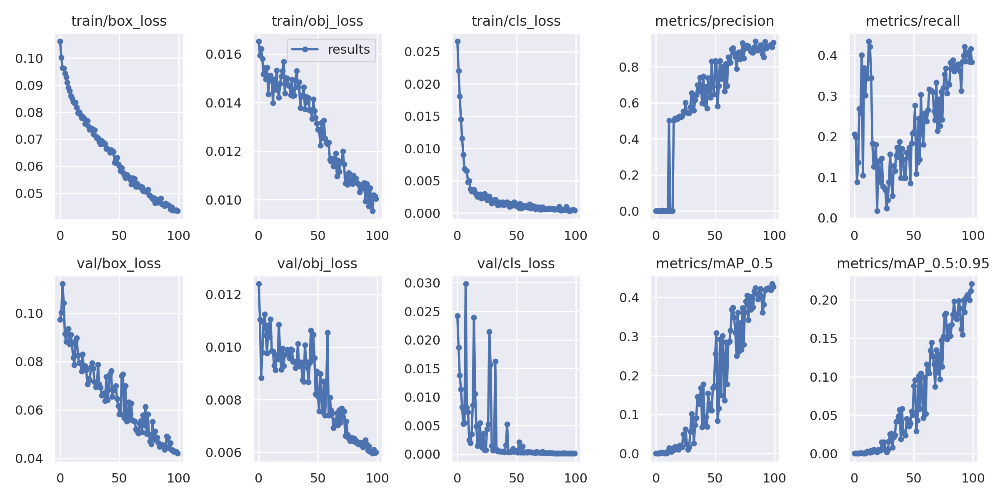

In [ ]:
# dapat meletakan beberapa output dari tensor board jika tidak dapat bekerja/muncul
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results7/results.png', width=1000)  # view results.png

### Visualisasikan Training Data Kita Menggunakan Label

Setelah training mulai, lihat `train*.jpg` untuk melihat gambar training, label dan efek augmentasi.

GROUND TRUTH TRAINING DATA:


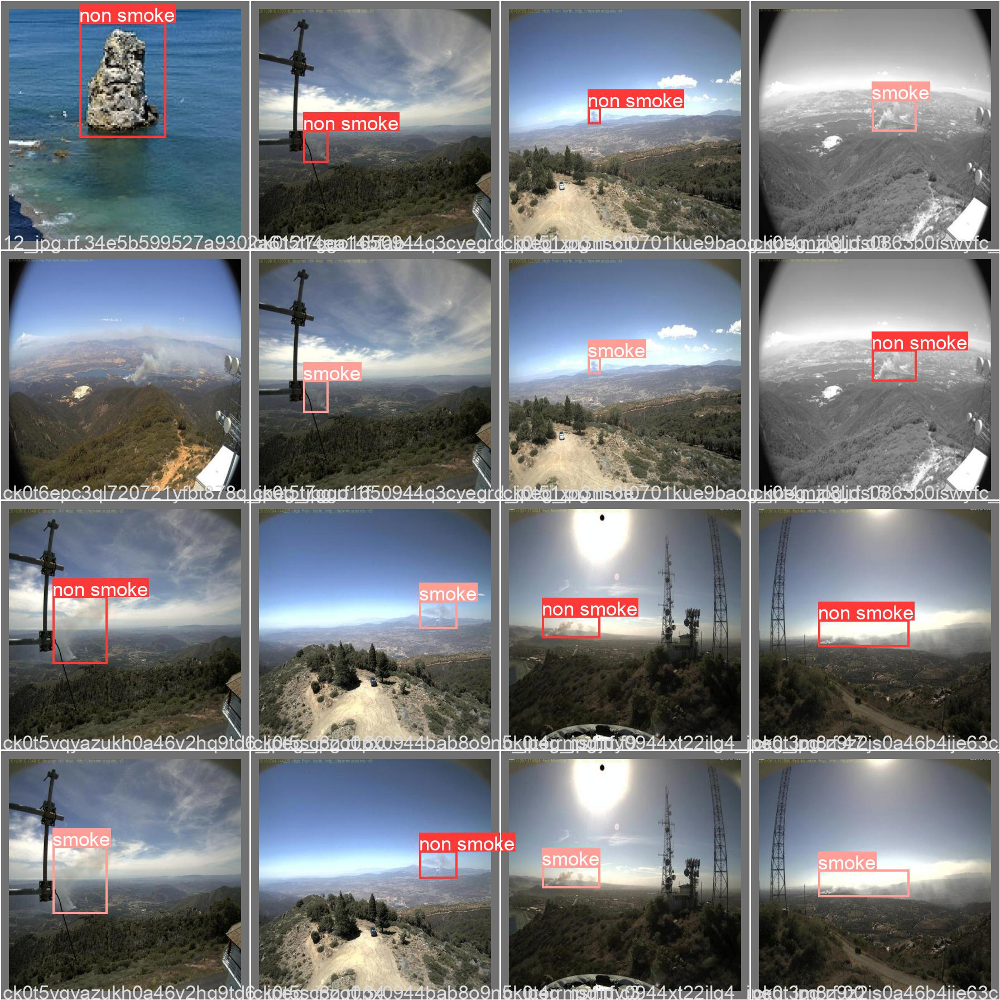

In [ ]:
# menampilkan ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results7/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


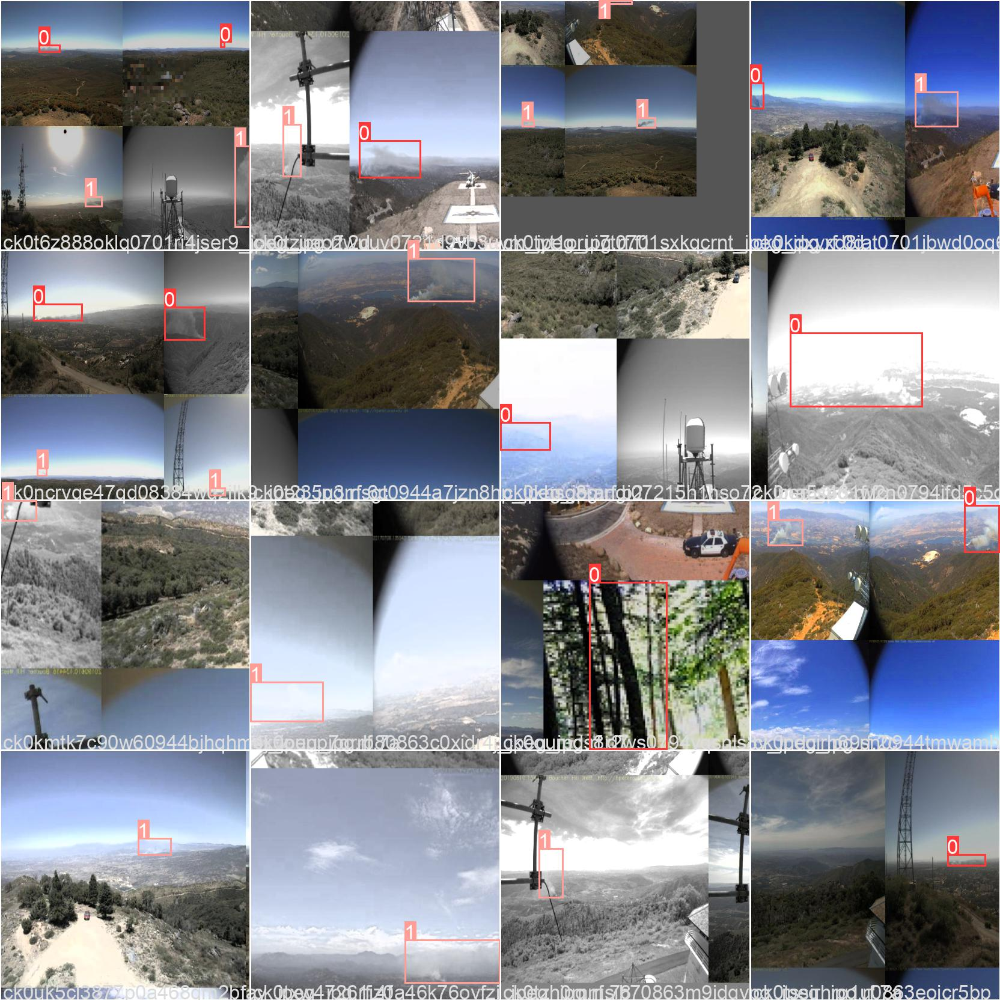

In [ ]:
# menampilkan augmentasi training data
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results7/train_batch0.jpg', width=900)

#Jalankan Dengan Data Testing
Jalankan dengan data terlatih di folder `test/images` folder yang didownload dari Roboflow.

In [ ]:
# data terlatih akan terimpan secara default di folder weights
%ls runs/

detect/  train/


In [ ]:
%ls runs/train/yolov5s_results7/weights

best.pt  last.pt


In [ ]:
# ketika kita menjalankan ini, dapat terlihat .007 second inference time. That is 140 FPS on a TESLA P100!
# gunakan weights terbaik!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results7/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/wildfire-prediction-2/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results7/weights/best.pt'], source=/content/yolov5/wildfire-prediction-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.7 GFLOPs
image 1/153 /content/yolov5/wildfire-prediction-2/test/images/14_jpg.rf.127975bfa0a2746fdf65cfaecc7032f0.jpg: 416x416 Done. (0.011s)
image 2/153 /content/yolov5/wildfire-prediction-2/test/images/16_jpg.rf.414c39310a2a3971f5038dd799346631.jpg: 416x416 Done. (0.011s)
image 3/153 /content/yolov5

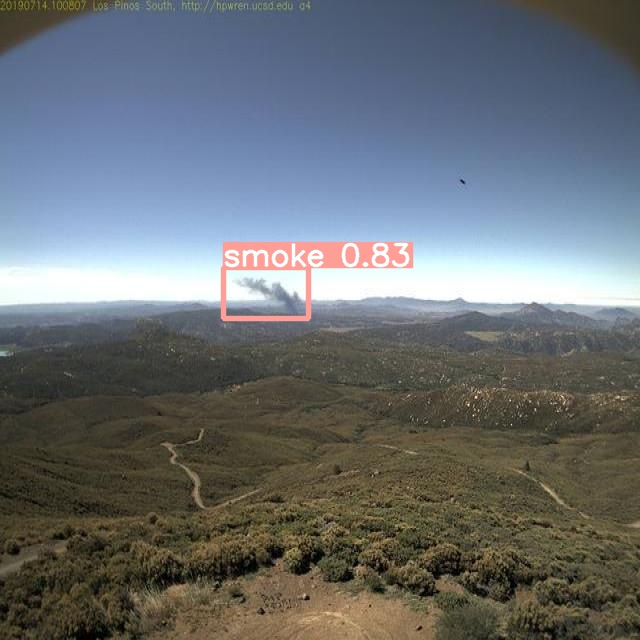

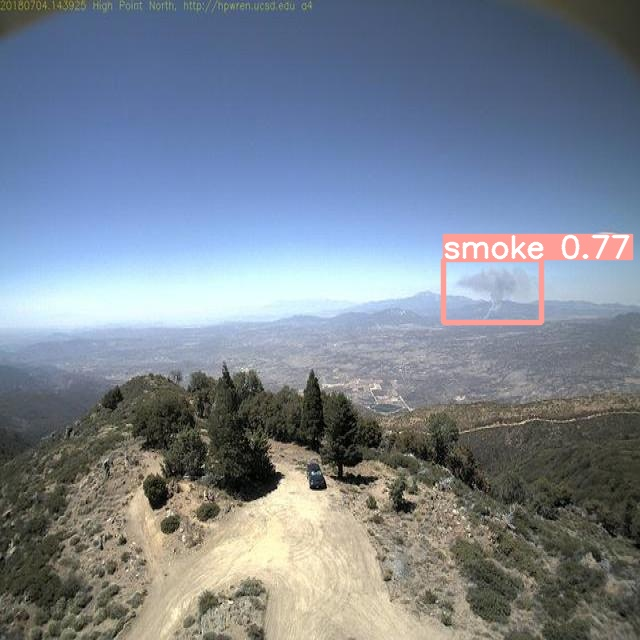

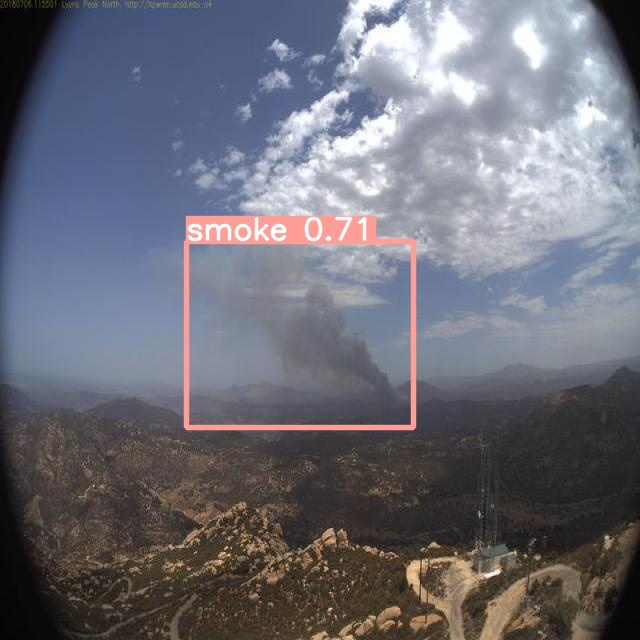

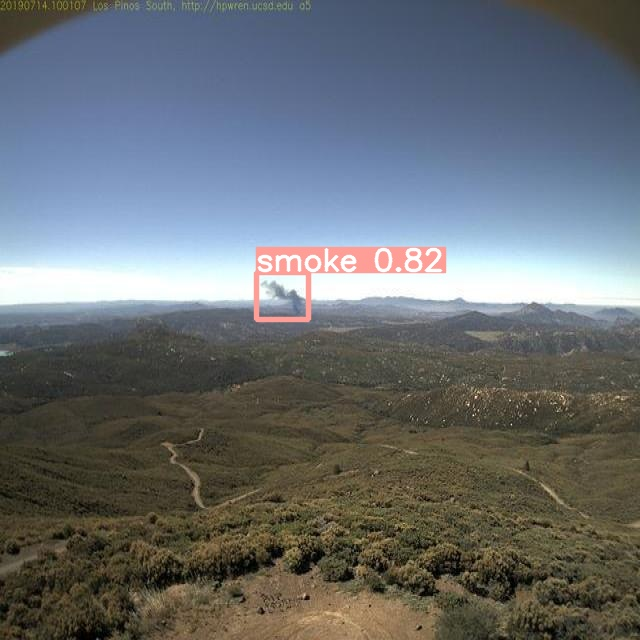

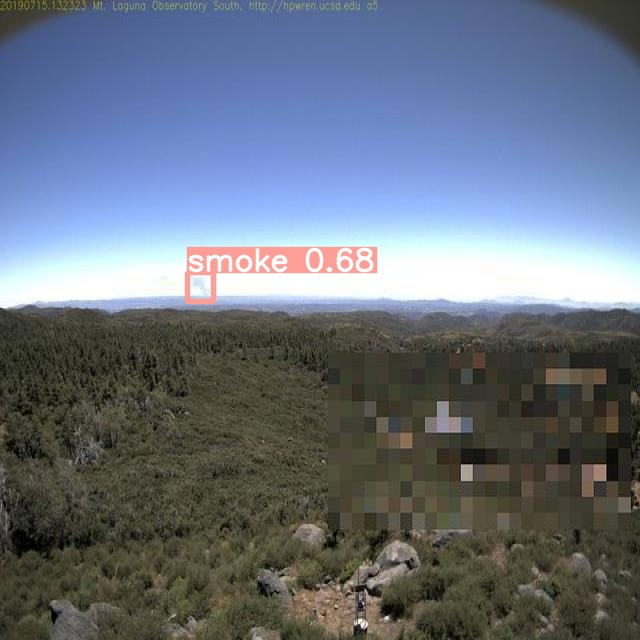

...

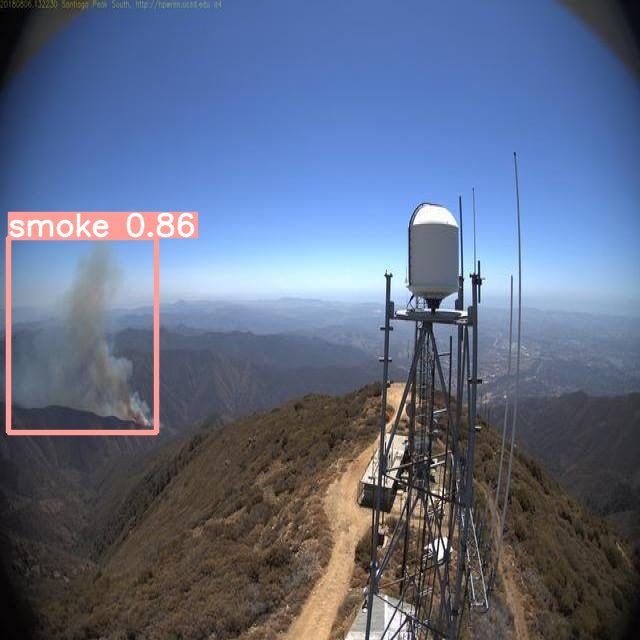

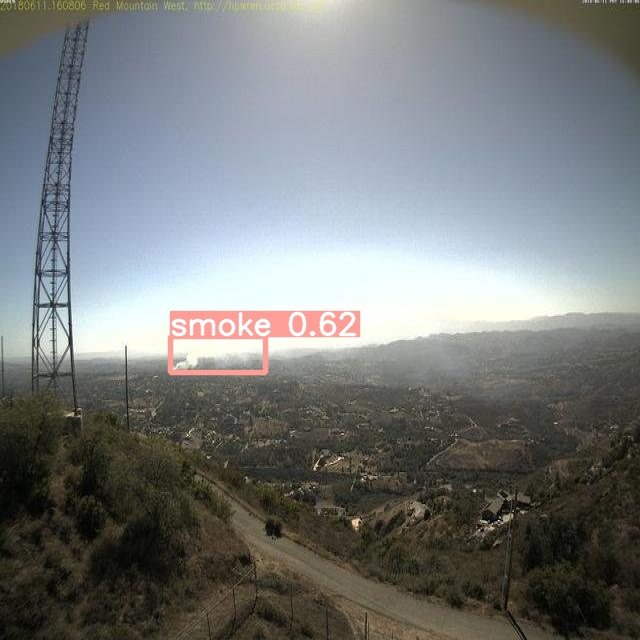

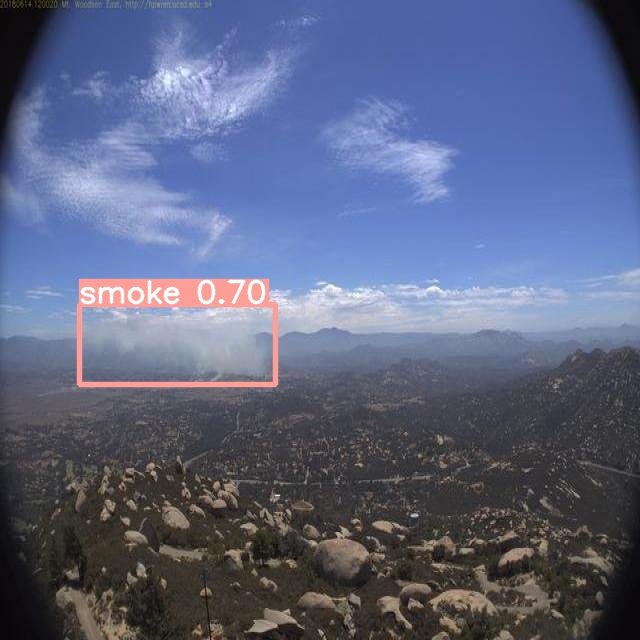

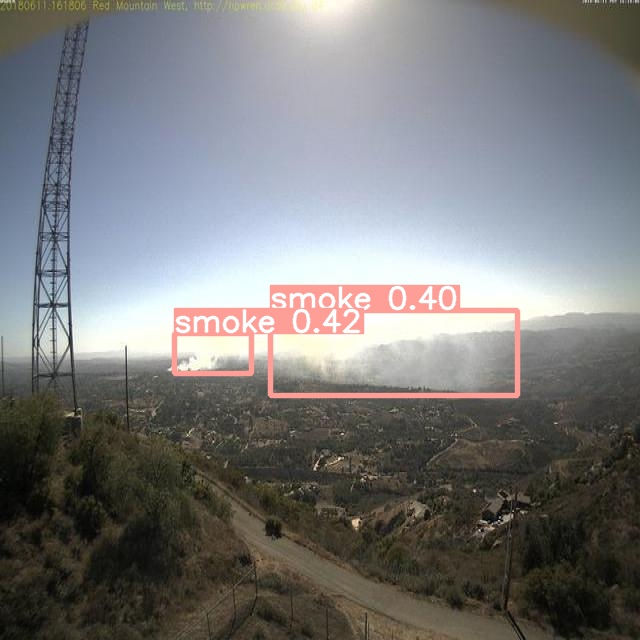

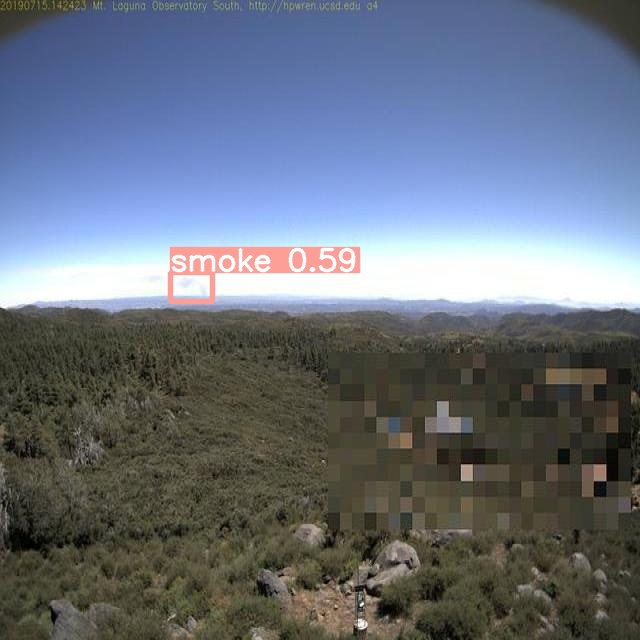

In [ ]:
# menampilkan antarmuka dari semua gambar testing
# ini mungkin lebih lama dari training diatas

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp10/*.jpg'): # JPG
    display(Image(filename=imageName))
    print("\n")

# Export Data Terlatih

Setelah melatih data, anda dapat mengekspor data terlatih yang telah anda buat untuk infrensi (sampel) perangkat anda di tempat lain.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)